# Dimensionality Reduction, Clustering, and Classification

## Overview

In this activity, we are going to implement three major concepts in machine learning - dimension reduction, clustering, and classification. Our workflow will be guided by the following:
1. We apply Principal Component Analysis (PCA) on dataset of focus. Choose the number of principal components (PCs) that preserves at least 95% of the variability of the data. 
2. We perform clustering on the chosen PCs as features. Three (3) clustering algorithms will be evaluated and compared in terms of some metrics. We choose the best one.
3. Using the best clustering method, we use it's predicted clusters as target labels in our classification implementation. We compare three classifiers and choose the best one in terms of some metrics.
4. Finally, using the best classifier, we implement a classification scheme with the original features and evaluate its performance.

## Data Description

In [1]:
# import dataset
import pandas as pd

class_0 = pd.read_csv('resources/ASL digits/0/Output Images - Sign 0.csv')
class_1 = pd.read_csv('resources/ASL digits/1/Output Images - Sign 1.csv')
class_2 = pd.read_csv('resources/ASL digits/2/Output Images - Sign 2.csv')
class_3 = pd.read_csv('resources/ASL digits/3/Output Images - Sign 3.csv')
class_4 = pd.read_csv('resources/ASL digits/4/Output Images - Sign 4.csv')
class_5 = pd.read_csv('resources/ASL digits/5/Output Images - Sign 5.csv')
class_6 = pd.read_csv('resources/ASL digits/6/Output Images - Sign 6.csv')
class_7 = pd.read_csv('resources/ASL digits/7/Output Images - Sign 7.csv')
class_8 = pd.read_csv('resources/ASL digits/8/Output Images - Sign 8.csv')
class_9 = pd.read_csv('resources/ASL digits/9/Output Images - Sign 9.csv')

In [2]:
classes = [class_0, class_1, class_2, class_3, class_4,
           class_5, class_6, class_7, class_8, class_9]
ASL = pd.concat(classes)
ASL.reset_index(inplace=True)

ASL.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 66 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   index               5000 non-null   int64  
 1   Single Image Frame  5000 non-null   object 
 2   x00                 5000 non-null   float64
 3   y00                 5000 non-null   float64
 4   z00                 5000 non-null   float64
 5   x01                 5000 non-null   float64
 6   y01                 5000 non-null   float64
 7   z01                 5000 non-null   float64
 8   x02                 5000 non-null   float64
 9   y02                 5000 non-null   float64
 10  z02                 5000 non-null   float64
 11  x03                 5000 non-null   float64
 12  y03                 5000 non-null   float64
 13  z03                 5000 non-null   float64
 14  x04                 5000 non-null   float64
 15  y04                 5000 non-null   float64
 16  z04   

In [3]:
ASL['path'] = ASL['Single Image Frame']
ASL.drop(['index', 'Single Image Frame'], axis=1, inplace=True)
ASL.head(5)

,x00,y00,z00,x01,y01,z01,x02,y02,z02,x03,...,y18,z18,x19,y19,z19,x20,y20,z20,Label,path
0,0.619474,0.576919,-0.000183,0.445639,0.603318,0.014718,0.291044,0.567763,-0.028874,0.177820,...,0.213393,-0.296508,0.243377,0.301453,-0.309386,0.213000,0.394640,-0.306082,0,D:\ASL Digits\0\Sign 0 (1).jpeg
1,0.619474,0.576919,-0.000183,0.445639,0.603318,0.014718,0.291044,0.567763,-0.028874,0.177820,...,0.213393,-0.296508,0.243377,0.301453,-0.309386,0.213000,0.394640,-0.306082,0,D:\ASL Digits\0\Sign 0 (2).jpeg
2,0.611502,0.513223,-0.000178,0.413892,0.537636,0.055252,0.272933,0.499767,0.005764,0.168678,...,0.212490,-0.345101,0.256321,0.297979,-0.358794,0.241637,0.374991,-0.346573,0,D:\ASL Digits\0\Sign 0 (3).jpeg
3,0.602408,0.475819,-0.000091,0.403730,0.478054,0.026665,0.270717,0.447502,-0.035418,0.171954,...,0.163477,-0.351066,0.289828,0.229483,-0.365348,0.254105,0.293561,-0.347958,0,D:\ASL Digits\0\Sign 0 (4).jpeg
4,0.641185,0.666954,-0.000322,0.434012,0.606183,0.122914,0.326627,0.476359,0.132520,0.242037,...,0.143282,-0.184124,0.358473,0.170378,-0.191191,0.295198,0.245673,-0.184907,0,D:\ASL Digits\0\Sign 0 (5).jpeg


## Dimension Reduction

In [4]:
from sklearn.decomposition import PCA

X_true = ASL.iloc[:,:63].to_numpy(dtype=float)
y_true = ASL.iloc[:, 63].to_numpy(dtype=int)
print(f"Original dimension: {X_true.shape[0]} samples x {X_true.shape[1]} features")

pca = PCA(n_components=0.96, svd_solver='full')  # select the number of components such that the amount of variance that needs to be explained is greater than the percentage specified by n_components.
X_pc = pca.fit_transform(X_true)
print(f"PCA is implemented. {X_pc.shape[1]} PCs are selected to preserve at least 95% variability.")
print(f"New dimension: {X_pc.shape[0]} samples x {X_pc.shape[1]} features")

Original dimension: 5000 samples x 63 features
PCA is implemented. 12 PCs are selected to preserve at least 95% variability.
New dimension: 5000 samples x 12 features


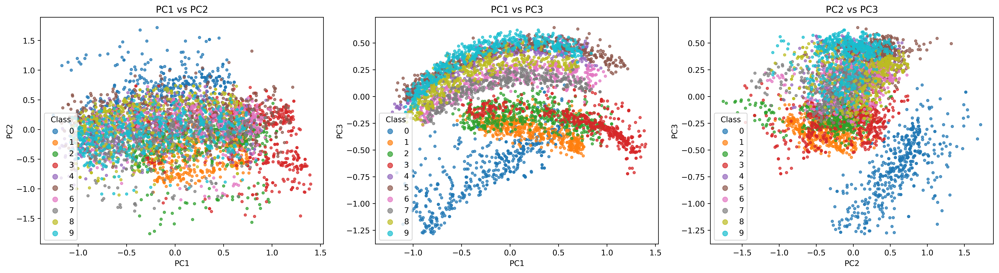

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
plt.rcParams['figure.dpi'] = 500

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
unique_labels = np.unique(y_true)
colors = plt.cm.tab10.colors  # or use any colormap you prefer

# PC1 vs PC2
for i, label in enumerate(unique_labels):
    idx = y_true == label
    axes[0].scatter(X_pc[idx, 0], X_pc[idx, 1], s=10, alpha=0.7, color=colors[i % len(colors)], label=str(label))
axes[0].set_xlabel('PC1')
axes[0].set_ylabel('PC2')
axes[0].set_title('PC1 vs PC2')
axes[0].legend(title="Class", markerscale=2, loc="lower left")

# PC1 vs PC3
for i, label in enumerate(unique_labels):
    idx = y_true == label
    axes[1].scatter(X_pc[idx, 0], X_pc[idx, 2], s=10, alpha=0.7, color=colors[i % len(colors)], label=str(label))
axes[1].set_xlabel('PC1')
axes[1].set_ylabel('PC3')
axes[1].set_title('PC1 vs PC3')
axes[1].legend(title="Class", markerscale=2, loc="lower left")

# PC2 vs PC3
for i, label in enumerate(unique_labels):
    idx = y_true == label
    axes[2].scatter(X_pc[idx, 1], X_pc[idx, 2], s=10, alpha=0.7, color=colors[i % len(colors)], label=str(label))
axes[2].set_xlabel('PC2')
axes[2].set_ylabel('PC3')
axes[2].set_title('PC2 vs PC3')
axes[2].legend(title="Class", markerscale=2, loc="lower left")

plt.tight_layout()
plt.show()

In [12]:
sum(pca.explained_variance_)

np.float64(0.9573925180569344)

## Clustering

- Identify which clustering algorithm best separates the data into 10 clusters using silhouette score.
- Use the predicted clusters of the best algorithm as targets/labels in the classification scheme.

In [13]:
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
import numpy as np

clusters = ['kmeans', 'hierarchical clustering', 'DBSCAN']
kmeans = KMeans(n_clusters=10, init='k-means++')
hier = AgglomerativeClustering(n_clusters=10)
dbscan = DBSCAN(eps=0.35, min_samples=13)

In [14]:
y_kmeans = kmeans.fit_predict(X_pc)
y_hier = hier.fit_predict(X_pc)
y_dbscan = dbscan.fit_predict(X_pc)

# identify outliers into closest cluster centroid
outliers_ind = np.where(y_dbscan == -1)[0]
centroids = [X_pc[np.where(y_dbscan==i)[0]].mean(axis=0) for i in range(10)]
for i in outliers_ind:
    dists = [np.linalg.norm(X_pc[i]-centroids[j]) for j in range(10)]
    y_dbscan[i] = int(np.argmin(dists))

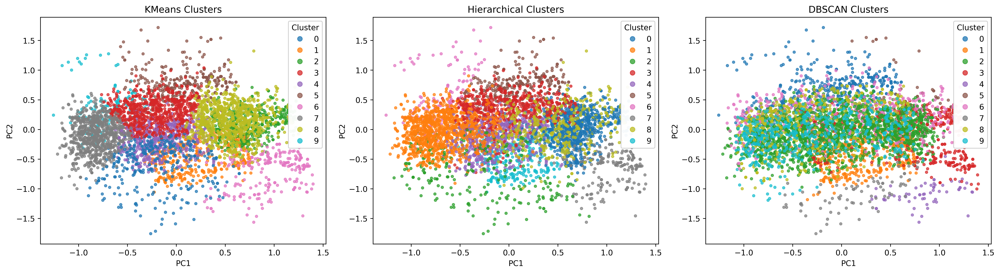

In [17]:
clusterings = [y_kmeans, y_hier, y_dbscan]
titles = ['KMeans Clusters', 'Hierarchical Clusters', 'DBSCAN Clusters']

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
for i, (clustering, title) in enumerate(zip(clusterings, titles)):
    scatter = axes[i].scatter(X_pc[:, 0], X_pc[:, 1], c=clustering, cmap='tab10', s=10, alpha=0.7)
    axes[i].set_xlabel('PC1')
    axes[i].set_ylabel('PC2')
    axes[i].set_title(title)
    legend1 = axes[i].legend(*scatter.legend_elements(), title="Cluster", loc="best", markerscale=1)
    axes[i].add_artist(legend1)

plt.tight_layout()
plt.show()

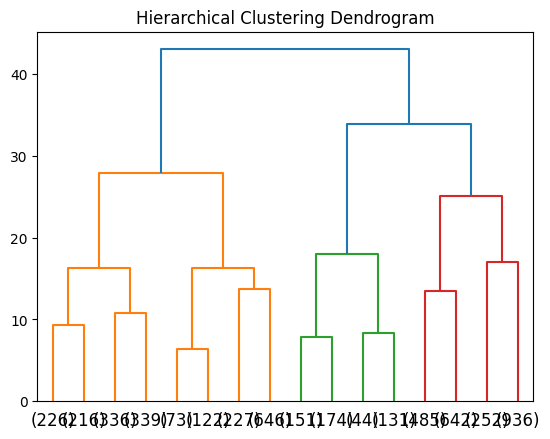

In [196]:
from scipy.cluster.hierarchy import dendrogram
import matplotlib.pyplot as plt

def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

hier2 = AgglomerativeClustering(distance_threshold=0, n_clusters=None)
hier2 = hier2.fit(X_pc)
plt.title("Hierarchical Clustering Dendrogram")
# plot the top three levels of the dendrogram
plot_dendrogram(hier2, truncate_mode="level", p=3)
plt.xticks(ticks=None, labels=None)
plt.show()

In [18]:
from sklearn.metrics import silhouette_score

# compare clustering algorithms via silhouette scores
scores = [silhouette_score(X_pc, ys, metric='euclidean')
          for ys in [y_kmeans, y_hier, y_dbscan]]
print(f"Minimum silhouette score of {scores[np.argmin(scores)]:.4f} is obtained by: {clusters[np.argmin(scores)]}.")

Minimum silhouette score of 0.1286 is obtained by: DBSCAN.


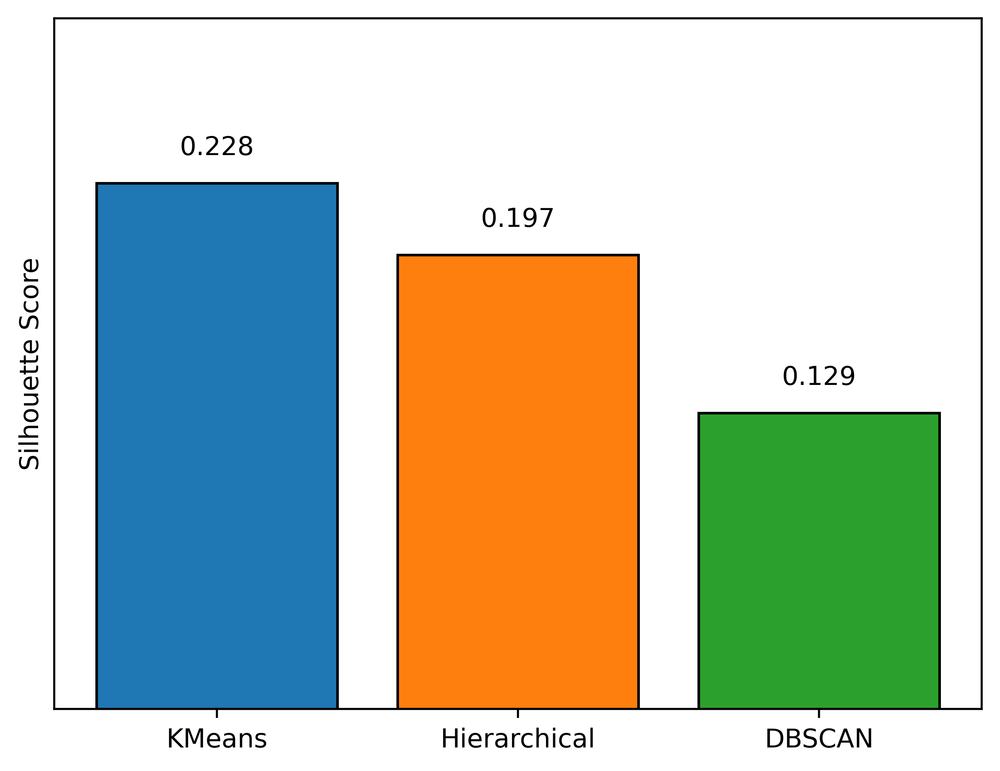

In [32]:
cluster_names = ['KMeans', 'Hierarchical', 'DBSCAN']

fig = plt.gca()
bars = fig.bar(cluster_names, scores, color=['#1f77b4', '#ff7f0e', '#2ca02c'], edgecolor='k')
fig.set_ylabel('Silhouette Score')
fig.set_ylim(0, 0.3)
for bar, score in zip(bars, scores):
    fig.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01, f"{score:.3f}", 
             ha='center', va='bottom', fontsize=10)

fig.axes.get_yaxis().set_ticks([])
plt.show()

## Classification

- Using the _best_ clusters as target labels, we compare 3 classifiers and select best one.

In [36]:
import numpy as np
import scipy.stats as stats

# global controls
y_clusters = y_kmeans
tune_clsf = True
n_folds = 5
models = ['svm', 'knn', 'rf']
metrics = ['f1-score', 'accuracy']

# tuning parameters for each classifier
svm_params = {'C': stats.uniform(2**-3, 2**15), 
              "gamma": ["auto", "scale"], 
              "kernel": ['rbf']}
knn_params = {"n_neighbors": np.arange(1,500+1)}
rf_params = {"n_estimators": np.arange(1,350+1), 
             "max_depth": np.arange(1,5+1), 
             "min_samples_split": np.arange(2,10+1, 1)}

# params and score placeholders
best_params, best_score = [], []

In [37]:
from sklearn.model_selection import train_test_split, StratifiedKFold, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier

print("Loading the dataset ...")
n_data = len(y_true)
print(f"{n_data} data points collected.")


# splitting the dataset
X_train, X_test, y_train, y_test = train_test_split(X_pc, y_clusters, 
                                                    test_size=0.30,
                                                    stratify=y_clusters,
                                                    random_state=21)
print('Dataset is split into training (70%) and test (30%) sets. \n')

# scaling dataset
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
print("Datasets are scaled using Standard Scaler. \n")

# ---------- Hyperparameter Tuning (Randomized Search Cross Validation)
print('Tuning hyper-parameters of classifiers using Random Search CV. \n')

classifiers = [SVC(), KNeighborsClassifier(), RandomForestClassifier()]
params = [svm_params, knn_params, rf_params]
cv = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=21)

if tune_clsf:
    for idx in range(len(classifiers)):
        model = models[idx]
        print(f'{model} ------------')

        clsf_tuned = RandomizedSearchCV(estimator=classifiers[idx],
                                        param_distributions=params[idx],
                                        n_iter=20,
                                        scoring=['accuracy'],
                                        refit='accuracy',
                                        cv=cv,
                                        verbose=1)
        clsf_tuned.fit(X_train, y_train)
        best_params.append(clsf_tuned.best_params_)
        best_score.append(clsf_tuned.best_score_)
        print(f"Optimal hyperparameters of {model} are {clsf_tuned.best_params_}")
        print(f"Highest accuracy of optimal {model}: {clsf_tuned.best_score_} \n")

Loading the dataset ...
5000 data points collected.
Dataset is split into training (70%) and test (30%) sets. 

Datasets are scaled using Standard Scaler. 

Tuning hyper-parameters of classifiers using Random Search CV. 

svm ------------
Fitting 5 folds for each of 20 candidates, totalling 100 fits
Optimal hyperparameters of svm are {'C': np.float64(21948.4259529091), 'gamma': 'scale', 'kernel': 'rbf'}
Highest accuracy of optimal svm: 0.9574285714285715 

knn ------------
Fitting 5 folds for each of 20 candidates, totalling 100 fits
Optimal hyperparameters of knn are {'n_neighbors': np.int64(62)}
Highest accuracy of optimal knn: 0.8674285714285714 

rf ------------
Fitting 5 folds for each of 20 candidates, totalling 100 fits
Optimal hyperparameters of rf are {'n_estimators': np.int64(142), 'min_samples_split': np.int64(7), 'max_depth': np.int64(5)}
Highest accuracy of optimal rf: 0.9317142857142857 



In [39]:
from sklearn.metrics import accuracy_score, f1_score

svm_tuned = SVC().set_params(**best_params[0])
knn_tuned = KNeighborsClassifier().set_params(**best_params[1])
rf_tuned = RandomForestClassifier().set_params(**best_params[2])

svm_tuned.fit(X_train, y_train)
knn_tuned.fit(X_train, y_train)
rf_tuned.fit(X_train, y_train)

predictions = {mod: [] for mod in models}
for est, mod in zip([svm_tuned, knn_tuned, rf_tuned], models):
    predictions[mod] = est.predict(X_test)

scores = {mod: [] for mod in models}
for mod in models:
    scores[mod].append(f1_score(y_test, predictions[mod], average='macro'))
    scores[mod].append(accuracy_score(y_test, predictions[mod]))

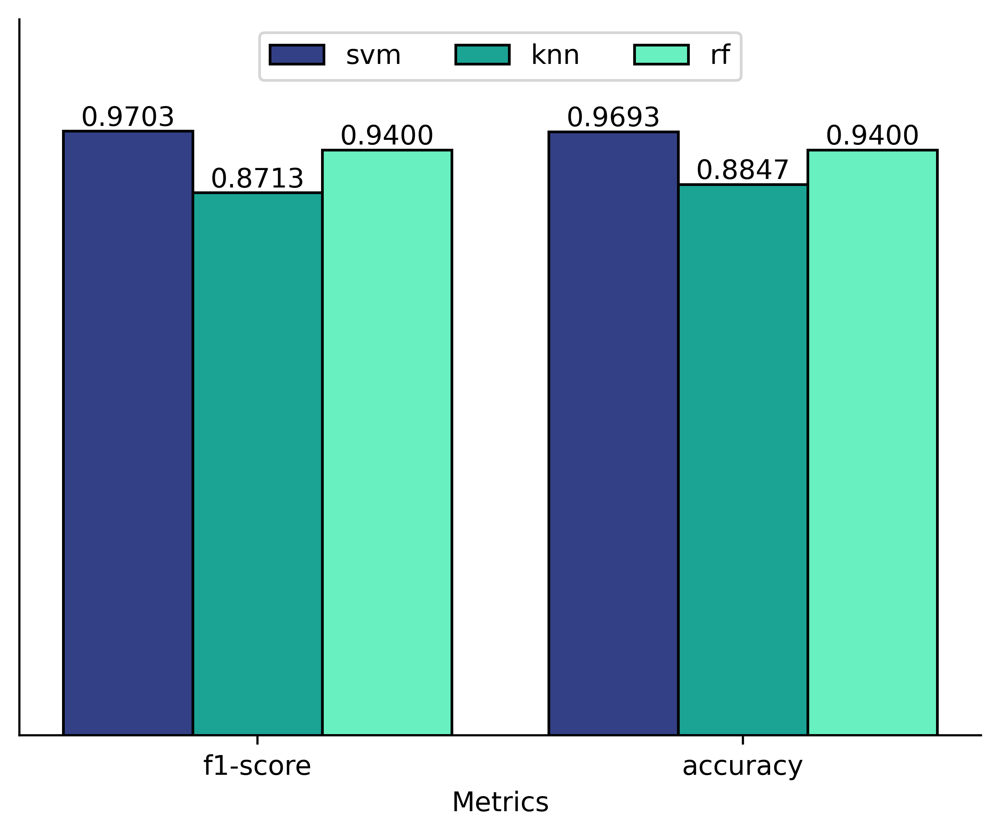

In [41]:
import matplotlib.pyplot as plt
import seaborn as sns

colors = ['#334085','#1ba394', '#68f0c0']

# for grouping bars
width = 0.2
shift = -1 * width
x = np.arange(len(scores['svm'])) * 0.75

# bar graphs
ax = plt.gca()
for mod, col in zip(models, colors):
    b = ax.bar(x+shift, scores[mod], color=col, label=mod, width=width, edgecolor='k')
    shift += width

    ax.bar_label(b, label_type='edge', fmt='%.4f')

ax.set_xticks(x, metrics)
ax.set_ylim(top=1.15)
ax.legend(loc='upper center', ncol=len(models))
ax.set_xlabel('Metrics')
# ax.set_ylabel('Score')
ax.get_yaxis().set_visible(False)
# ax.set_title('Metric scores of tuned classifiers on test data')
sns.despine()
plt.show()

In [42]:
print(f"Best classifier is: {models[np.argmax(best_score)]}")

Best classifier is: svm


## Final Classification

In [60]:
indices = ASL.index
train_indices, test_indices = train_test_split(indices, test_size=0.3,
                                               random_state=0,
                                               stratify=y_true)

X_train = X_true[train_indices]
X_test = X_true[test_indices]
y_train = y_true[train_indices]
y_test = y_true[test_indices]

svm_tuned = SVC().set_params(**best_params[0])
# svm_tuned = SVC()
svm_tuned.fit(X_train, y_train)
y_pred = svm_tuned.predict(X_test)

In [61]:
from sklearn.metrics import classification_report, confusion_matrix

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       150
           1       1.00      1.00      1.00       150
           2       1.00      1.00      1.00       150
           3       1.00      1.00      1.00       150
           4       1.00      1.00      1.00       150
           5       1.00      1.00      1.00       150
           6       1.00      1.00      1.00       150
           7       1.00      1.00      1.00       150
           8       1.00      1.00      1.00       150
           9       1.00      1.00      1.00       150

    accuracy                           1.00      1500
   macro avg       1.00      1.00      1.00      1500
weighted avg       1.00      1.00      1.00      1500



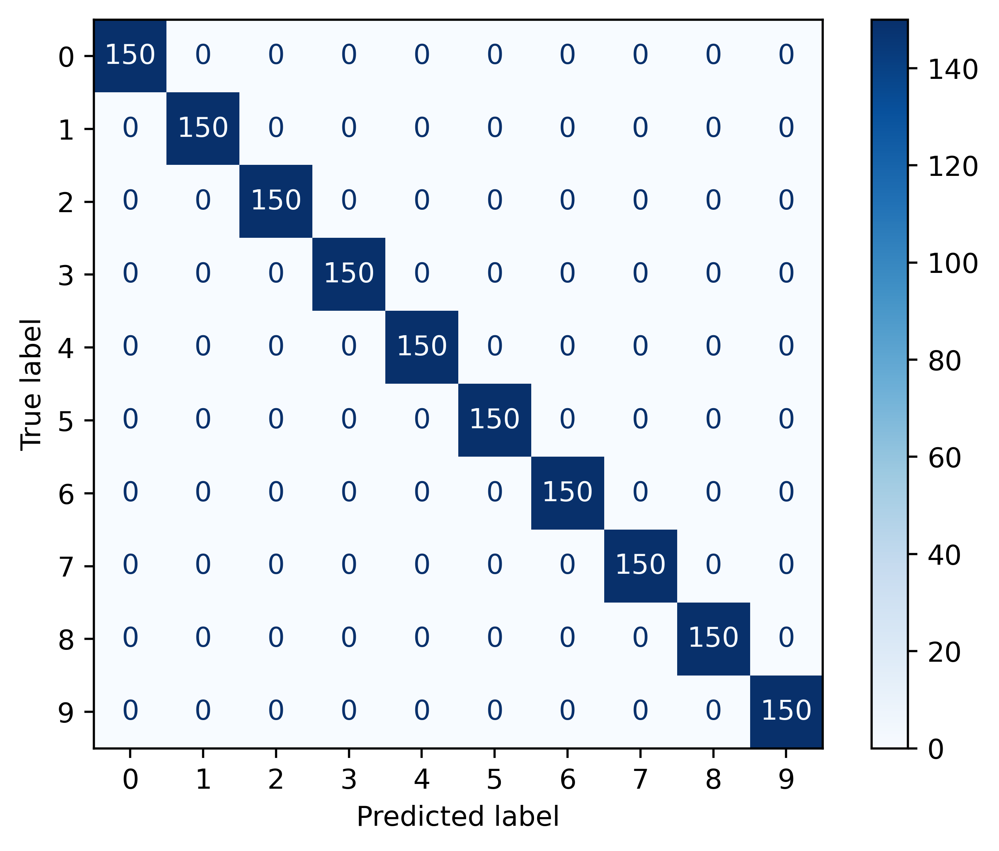

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix

cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues', values_format='d')
# plt.title("Confusion Matrix")
plt.show()

In [69]:
from statistics import mode

y_clusters_mapped = np.full_like(y_true, 0)
for i in range(10):
    ind = np.where(y_clusters == i)[0]
    class_i = y_true[ind]

    y_clusters_mapped[ind] = np.full_like(ind, mode(class_i))
    print(mode(class_i))

9
1
3
8
2
0
3
9
5
0


In [70]:
i = 3500
y_clusters[i], y_clusters_mapped[i]

(np.int32(0), np.int64(9))

In [166]:
np.where(y_dbscan == 2)[0]

array([1000, 1001, 1002, ..., 3997, 3998, 3999])

In [71]:
print(classification_report(y_test, y_clusters_mapped[test_indices],
                            zero_division=0))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       150
           1       1.00      0.91      0.95       150
           2       0.46      0.53      0.50       150
           3       0.60      0.73      0.66       150
           4       0.00      0.00      0.00       150
           5       0.23      0.41      0.30       150
           6       0.00      0.00      0.00       150
           7       0.00      0.00      0.00       150
           8       0.23      0.34      0.27       150
           9       0.20      0.50      0.29       150

    accuracy                           0.44      1500
   macro avg       0.37      0.44      0.40      1500
weighted avg       0.37      0.44      0.40      1500



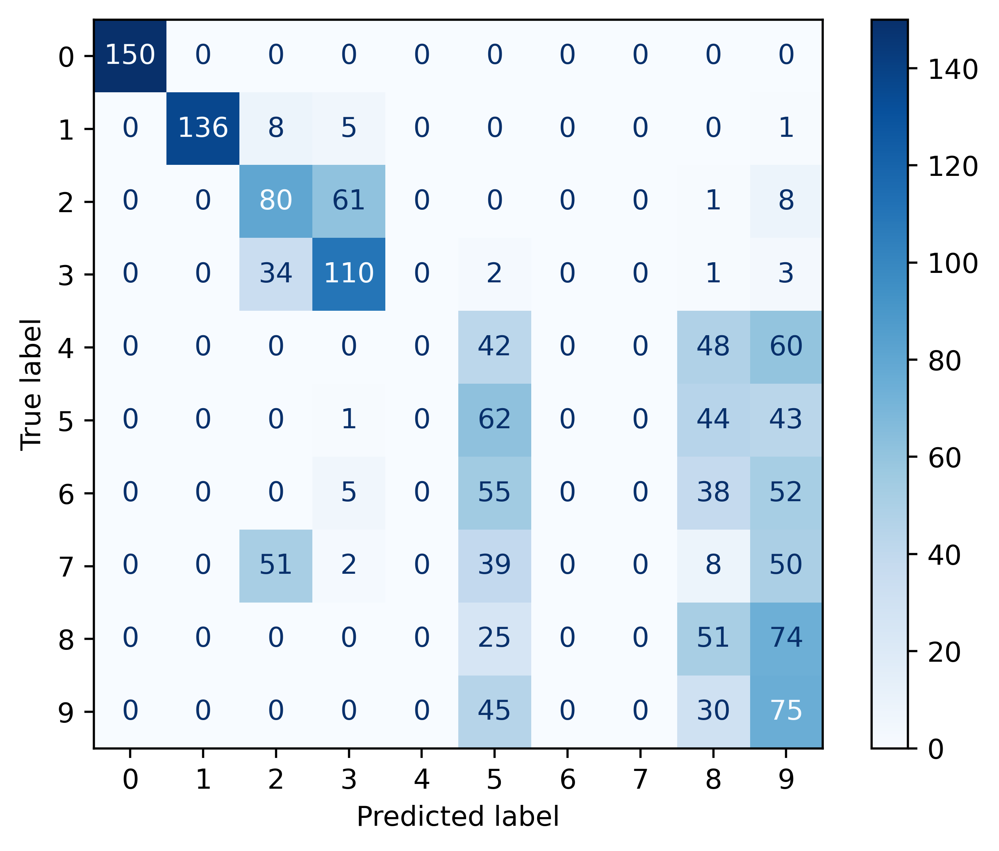

In [72]:
cm = confusion_matrix(y_test, y_clusters_mapped[test_indices])
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues', values_format='d')
# plt.title("Confusion Matrix")
plt.show()